In [1]:
# faceMask hDDM face ratings analysis script: mask analyses of false negatives (failing to ID correct emotion)
# 12/07/20

# note: to be run within python 3.5 environment named "hddm" (from console: 'source activate hddm')
# confirm jupyter notebook is launching from "hddm" environment (see top-right: 'conda env:hddm')

# set up
import numpy as np
print(np.__version__) # should be 1.11.3

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from patsy import dmatrix

import hddm
print(hddm.__version__) # should be 0.6.0

1.11.3
0.6.0


C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\IPython\parallel.py:13: ShimWarning: The `IPython.parallel` package has been deprecated since IPython 4.0. You should import from ipyparallel instead.
  "You should import from ipyparallel instead.", ShimWarning)


In [2]:
# load hDDM-processed data from CSV file into a NumPy structured array
data = hddm.load_csv('faceMask_hddm_proc.csv')
                     
# flip 'no' response RTs to be negative
data = hddm.utils.flip_errors(data)

# check dataset
data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
0,gc2le9xecjp1stz,0,3,angry,0,_faces/22_F_R_U.jpg,22_F_R_U,22,F,surprised,upper,0,-4.636150,0,0,0,0,0,50
1,gc2le9xecjp1stz,0,3,angry,1,_faces/07_M_H_L.jpg,07_M_H_L,7,M,happy,lower,0,-2.079460,0,0,0,50,0,0
2,gc2le9xecjp1stz,0,3,angry,2,_faces/46_M_R_X.jpg,46_M_R_X,46,M,surprised,baseline,0,-1.847670,0,0,0,0,0,100
3,gc2le9xecjp1stz,0,3,angry,3,_faces/47_M_S_L.jpg,47_M_S_L,47,M,sad,lower,0,-6.506275,0,0,0,0,50,0
4,gc2le9xecjp1stz,0,3,angry,4,_faces/25_M_R_X.jpg,25_M_R_X,25,M,surprised,baseline,0,-1.536780,0,0,0,0,0,100
5,gc2le9xecjp1stz,0,3,angry,5,_faces/27_F_A_U.jpg,27_F_A_U,27,F,angry,upper,1,1.906175,50,0,0,0,0,0
6,gc2le9xecjp1stz,0,3,angry,6,_faces/08_F_S_U.jpg,08_F_S_U,8,F,sad,upper,0,-2.182530,0,0,0,0,50,0
7,gc2le9xecjp1stz,0,3,angry,7,_faces/38_M_H_X.jpg,38_M_H_X,38,M,happy,baseline,0,-1.445230,0,0,0,100,0,0
8,gc2le9xecjp1stz,0,3,angry,8,_faces/30_M_A_U.jpg,30_M_A_U,30,M,angry,upper,1,1.405270,50,0,0,0,0,0
9,gc2le9xecjp1stz,0,3,angry,9,_faces/04_F_R_U.jpg,04_F_R_U,4,F,surprised,upper,0,-1.945385,0,0,0,0,0,50


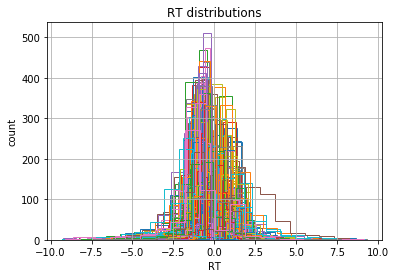

In [3]:
# plot RTs for each participant
fig = plt.figure()
ax = fig.add_subplot(111, xlabel='RT', ylabel='count', title='RT distributions')
for i, subj_data in data.groupby('subj_idx'):
    subj_data.rt.hist(bins=20, histtype='step', ax=ax)

In [4]:
# subset dataset by emotion rating type (surprised) and facial expression (angry)
ra_data = data.loc[(data['emotionRating'] == 'surprised') & (data['expression'] == 'angry')]
ra_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
534,gc2le9xecjp1stz,5,6,surprised,540,_faces/38_M_A_L.jpg,38_M_A_L,38,M,angry,lower,0,-1.050500,50,0,0,0,0,0
536,gc2le9xecjp1stz,5,6,surprised,542,_faces/24_M_A_X.jpg,24_M_A_X,24,M,angry,baseline,0,-1.189340,100,0,0,0,0,0
539,gc2le9xecjp1stz,5,6,surprised,545,_faces/18_F_A_X.jpg,18_F_A_X,18,F,angry,baseline,0,-0.951605,100,0,0,0,0,0
550,gc2le9xecjp1stz,5,6,surprised,556,_faces/02_F_A_U.jpg,02_F_A_U,2,F,angry,upper,0,-1.661875,50,0,0,0,0,0
554,gc2le9xecjp1stz,5,6,surprised,560,_faces/37_F_A_U.jpg,37_F_A_U,37,F,angry,upper,0,-1.069590,50,0,0,0,0,0
564,gc2le9xecjp1stz,5,6,surprised,570,_faces/24_M_A_U.jpg,24_M_A_U,24,M,angry,upper,0,-1.230535,50,0,0,0,0,0
569,gc2le9xecjp1stz,5,6,surprised,575,_faces/18_F_A_L.jpg,18_F_A_L,18,F,angry,lower,0,-0.910905,50,0,0,0,0,0
576,gc2le9xecjp1stz,5,6,surprised,586,_faces/02_F_A_L.jpg,02_F_A_L,2,F,angry,lower,0,-0.732850,50,0,0,0,0,0
578,gc2le9xecjp1stz,5,6,surprised,588,_faces/37_F_A_X.jpg,37_F_A_X,37,F,angry,baseline,0,-0.122125,100,0,0,0,0,0
584,gc2le9xecjp1stz,5,6,surprised,604,_faces/02_F_A_X.jpg,02_F_A_X,2,F,angry,baseline,1,0.130535,100,0,0,0,0,0


In [5]:
# drop any subjects missing columns in design matrix (otherwise produces error)
ra_data = ra_data[(ra_data.subj_idx != 'rc7s6vgpycw73ap')]

In [6]:
# define model
m_ra = hddm.HDDMRegressor(ra_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\pymc\Node.py:403: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.__name__ = input['__name__']


 [-----------------100%-----------------] 5001 of 5000 complete in 52079.6 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                        mean         std        2.5q         25q         50q          75q       97.5q       mc err
a                                    2.13916   0.0725881     2.00598     2.08885     2.13509      2.18727     2.28972   0.00375995
a_std                               0.783484   0.0638044    0.668939    0.738755    0.779567     0.825673    0.916943   0.00347232
a_subj.02hcv424u29nd5w               2.51424    0.315649      1.9695     2.28892     2.49126      2.70852     3.21577   0.00726642
a_subj.02k2uwlhgxnumn9               1.72682    0.285407     1.27839     1.52227     1.68609      1.89296     2.40027   0.00829234
a_subj.03g7h2hzq4o3g26               2.92887     0.50098     2.13062     2.56368      2.8693      3.22592     4.07394    0.0146662
a_subj.0nmr75cysk1ae0e               2.70151    0.358753     2.08321     2.44891     2.66885      2.92667     3.50141   0.00805058
a_subj.0t8qp67pqkw36cb               1.62348    0.296139     1.14609     1.41405   

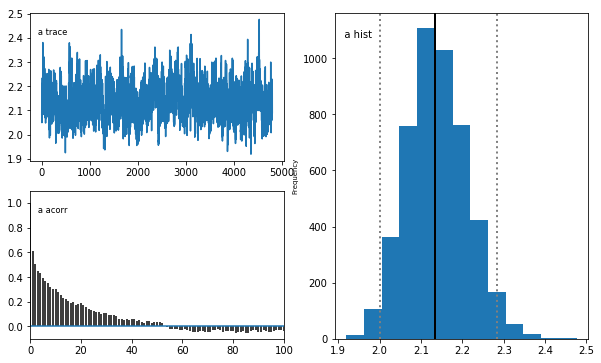

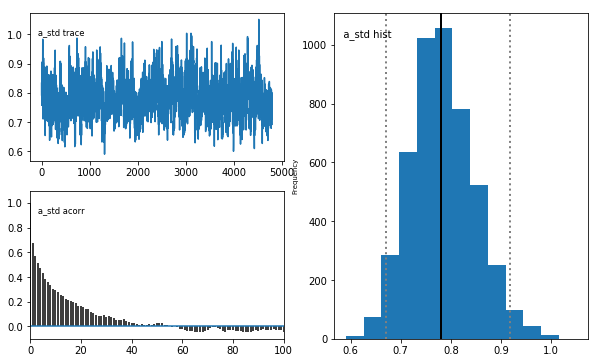

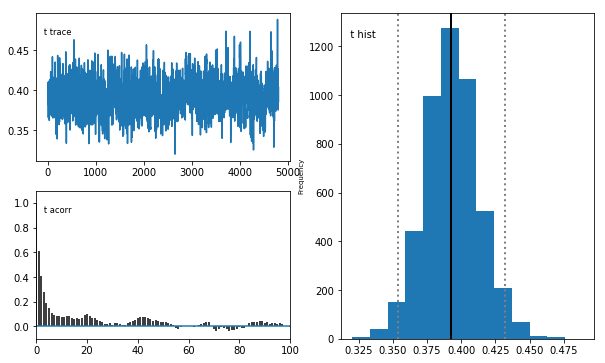

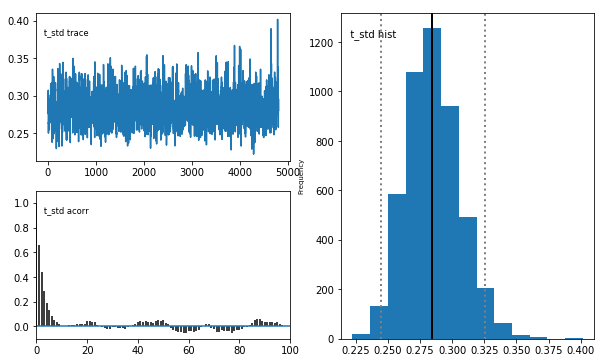

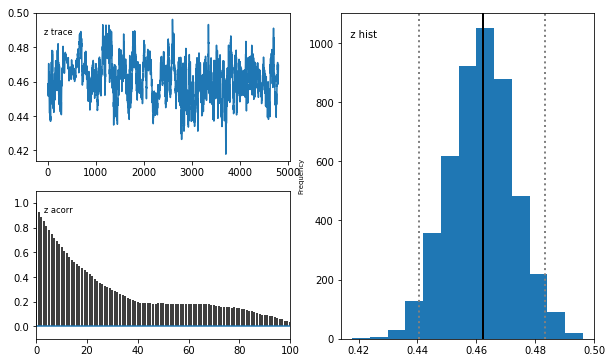

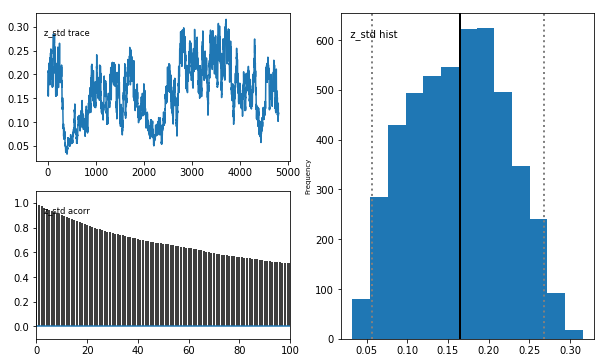

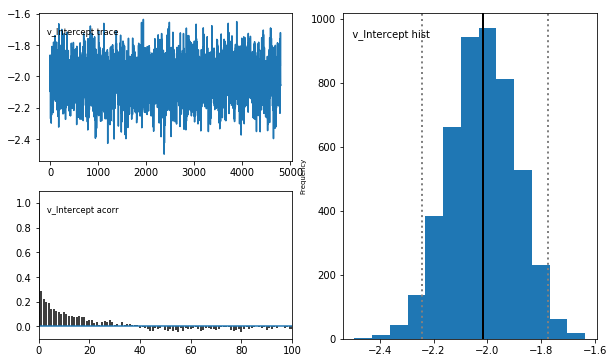

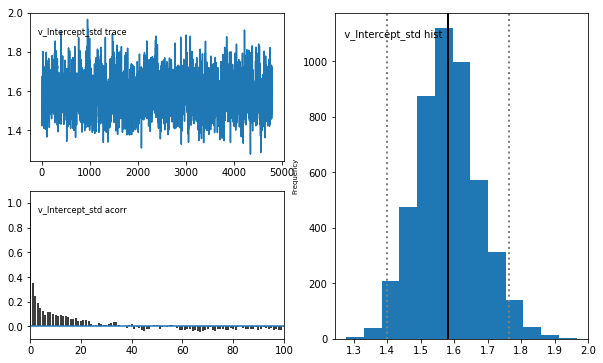

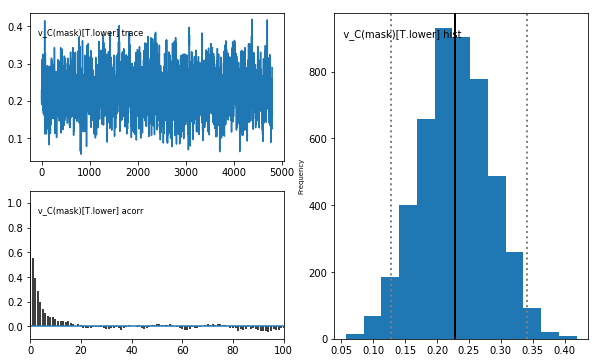

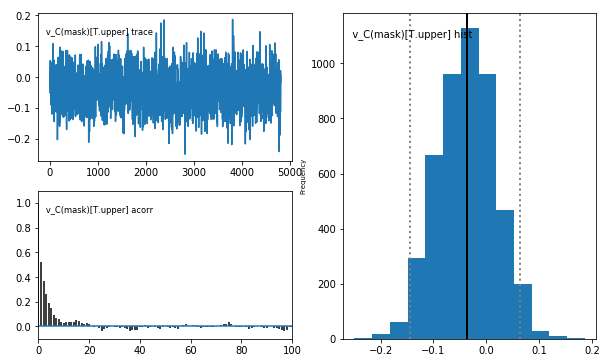

In [7]:
# run model
m_ra.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_ra.print_stats()
m_ra.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std      2.5q        25q  \
a                                   2.13916  0.0725881   2.00598    2.08885   
a_std                              0.783484  0.0638044  0.668939   0.738755   
a_subj.02hcv424u29nd5w              2.51424   0.315649    1.9695    2.28892   
a_subj.02k2uwlhgxnumn9              1.72682   0.285407   1.27839    1.52227   
a_subj.03g7h2hzq4o3g26              2.92887    0.50098   2.13062    2.56368   
a_subj.0nmr75cysk1ae0e              2.70151   0.358753   2.08321    2.44891   
a_subj.0t8qp67pqkw36cb              1.62348   0.296139   1.14609    1.41405   
a_subj.0vfpn4uf3t031qu              1.71947   0.478163    1.0068    1.36756   
a_subj.11dsfdtym1yy5mx              3.09053   0.453299   2.32894    2.75956   
a_subj.1d3dadyu4ekqb4q              1.40933    0.16931   1.11797    1.29045   
a_subj.1mt2emp4645cbl1              3.06831   0.789676   1.96167     2.5102   
a_subj.1rst24mbtgy9rc8              2.47213   0.4157

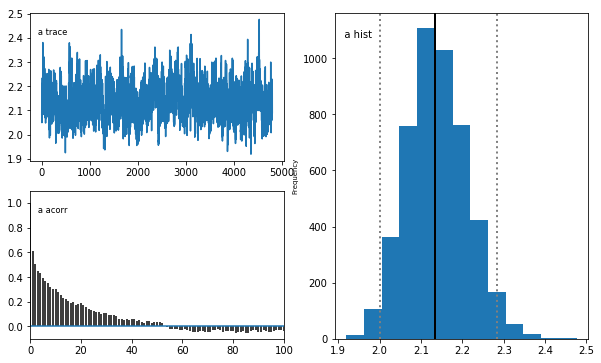

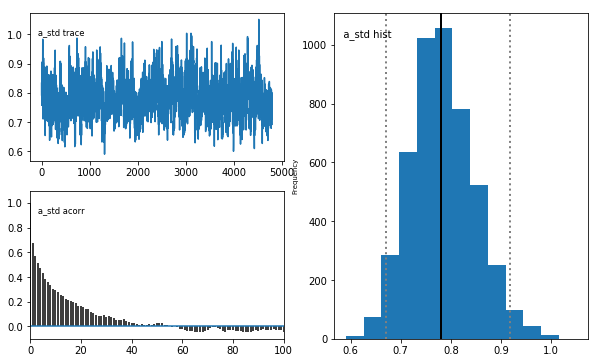

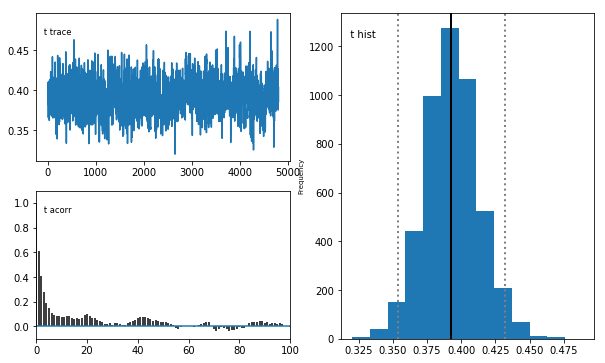

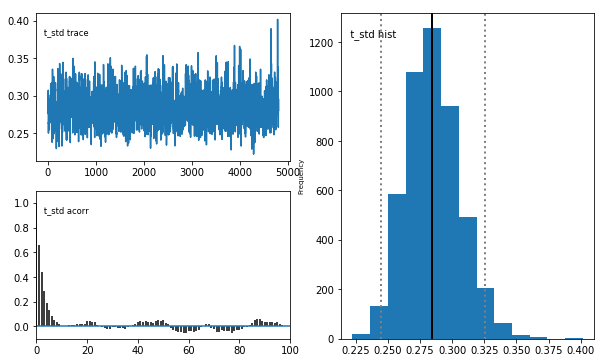

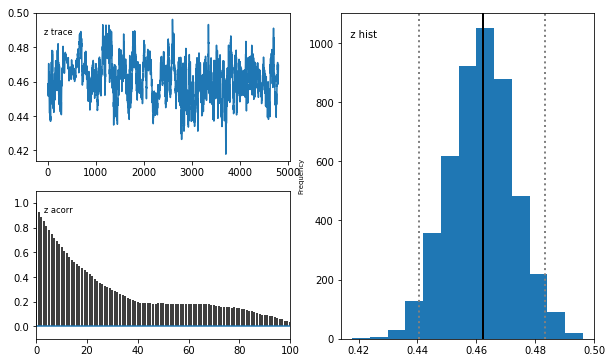

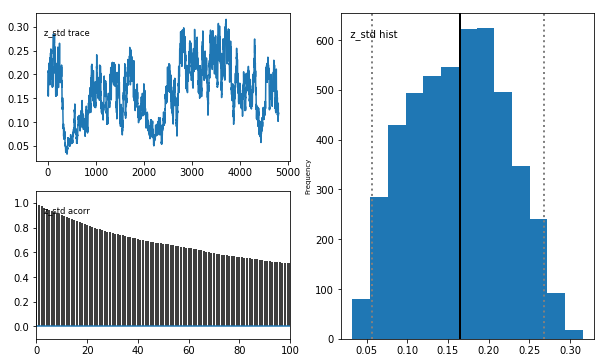

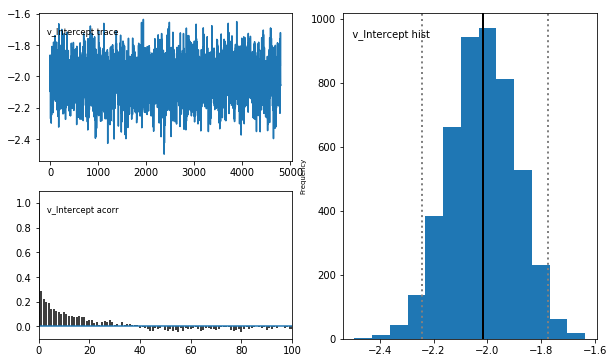

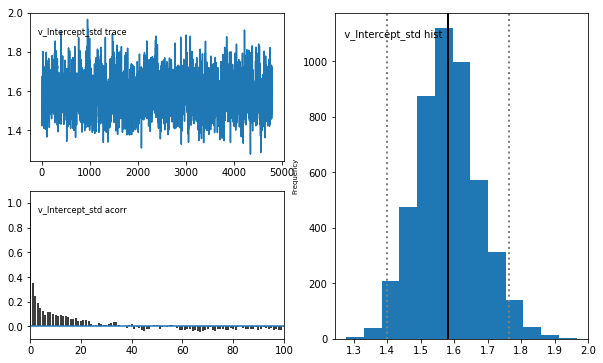

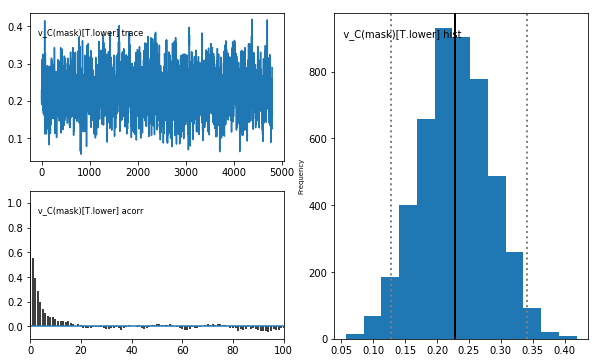

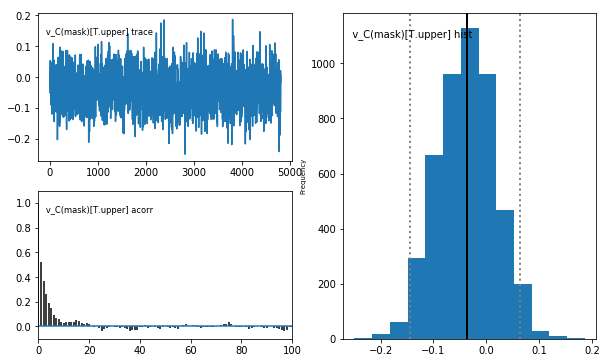

In [8]:
# save model stats
ra_stats = m_ra.gen_stats()
print(ra_stats)
ra_stats.to_csv('_maskFalsePositives/ra_5000/faceMask_hddm_drift_maskFalsePositives_ra_5000.csv', index=True)

# save model posterior plots
m_ra.plot_posteriors(path='_maskFalsePositives/ra_5000/_posteriors', save=True)

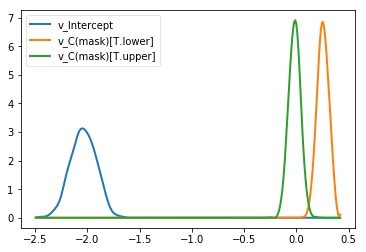

In [9]:
# plot model posteriors by mask
ra_v_none, ra_v_lower, ra_v_upper = m_ra.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([ra_v_none, ra_v_lower, ra_v_upper])
plt.savefig('_maskFalsePositives/ra_5000/faceMask_hddm_drift_maskFalsePositives_ra_5000_v_mask.pdf')

In [13]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(ra_v_none > 0) = ", (ra_v_none.trace() > 0).mean())
print("P(ra_v_lower < 0) = ", (ra_v_lower.trace() < 0).mean())
print("P(ra_v_upper > 0) = ", (ra_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(ra_v_lower < ra_v_upper) = ", (ra_v_lower.trace() < ra_v_upper.trace()).mean())

P(ra_v_none > 0) =  0.0
P(ra_v_lower < 0) =  0.0
P(ra_v_upper > 0) =  0.25125
P(ra_v_lower < ra_v_upper) =  0.0


In [14]:
# subset dataset by emotion rating type (surprised) and facial expression (disgusted)
rd_data = data.loc[(data['emotionRating'] == 'surprised') & (data['expression'] == 'disgusted')]
rd_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
543,gc2le9xecjp1stz,5,6,surprised,549,_faces/22_F_D_U.jpg,22_F_D_U,22,F,disgusted,upper,1,1.135595,0,50,0,0,0,0
546,gc2le9xecjp1stz,5,6,surprised,552,_faces/25_M_D_X.jpg,25_M_D_X,25,M,disgusted,baseline,1,0.969865,0,100,0,0,0,0
549,gc2le9xecjp1stz,5,6,surprised,555,_faces/25_M_D_U.jpg,25_M_D_U,25,M,disgusted,upper,0,-1.300725,0,50,0,0,0,0
553,gc2le9xecjp1stz,5,6,surprised,559,_faces/46_M_D_U.jpg,46_M_D_U,46,M,disgusted,upper,0,-1.226515,0,50,0,0,0,0
558,gc2le9xecjp1stz,5,6,surprised,564,_faces/22_F_D_X.jpg,22_F_D_X,22,F,disgusted,baseline,0,-1.259905,0,100,0,0,0,0
571,gc2le9xecjp1stz,5,6,surprised,577,_faces/46_M_D_X.jpg,46_M_D_X,46,M,disgusted,baseline,0,-0.776225,0,100,0,0,0,0
572,gc2le9xecjp1stz,5,6,surprised,578,_faces/09_M_D_L.jpg,09_M_D_L,9,M,disgusted,lower,1,0.172255,0,50,0,0,0,0
574,gc2le9xecjp1stz,5,6,surprised,583,_faces/04_F_D_X.jpg,04_F_D_X,4,F,disgusted,baseline,0,-0.125860,0,100,0,0,0,0
580,gc2le9xecjp1stz,5,6,surprised,594,_faces/25_M_D_L.jpg,25_M_D_L,25,M,disgusted,lower,1,0.102725,0,50,0,0,0,0
586,gc2le9xecjp1stz,5,6,surprised,611,_faces/46_M_D_L.jpg,46_M_D_L,46,M,disgusted,lower,0,-0.151110,0,50,0,0,0,0


In [15]:
# drop any subjects missing columns in design matrix (otherwise produces error)
rd_data = rd_data[(rd_data.subj_idx != 'ygpcur698h4dcw5') & (rd_data.subj_idx != 'rc7s6vgpycw73ap') & (rd_data.subj_idx != 'f89wrv54kh9lqrw') & (rd_data.subj_idx != '7chb1ucy8l7g29z')]

In [16]:
# define model
m_rd = hddm.HDDMRegressor(rd_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 51958.8 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std         2.5q        25q        50q        75q      97.5q       mc err
a                                   2.13695   0.277007      1.99026    2.07693    2.12441    2.17036    2.26998    0.0128406
a_std                              0.794392   0.401514     0.665169   0.733681   0.774339   0.816416   0.918596    0.0173769
a_subj.02hcv424u29nd5w              2.94773   0.392175      2.29272     2.6676    2.90685    3.18755    3.81996    0.0113805
a_subj.02k2uwlhgxnumn9              2.00069   0.312578      1.48779    1.77899    1.95735     2.1959    2.72174   0.00741242
a_subj.03g7h2hzq4o3g26              3.84062    0.64204      2.78846    3.38627    3.77626    4.21338    5.29282    0.0188585
a_subj.0nmr75cysk1ae0e              1.75492    0.26675      1.32715     1.5574    1.72853    1.91707    2.34716   0.00615834
a_subj.0t8qp67pqkw36cb              2.05277   0.393341      1.43933    1.77381    1.99592    2.26512    2.97368    0.0134154


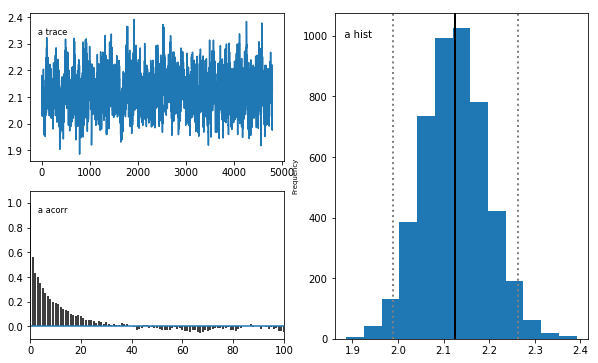

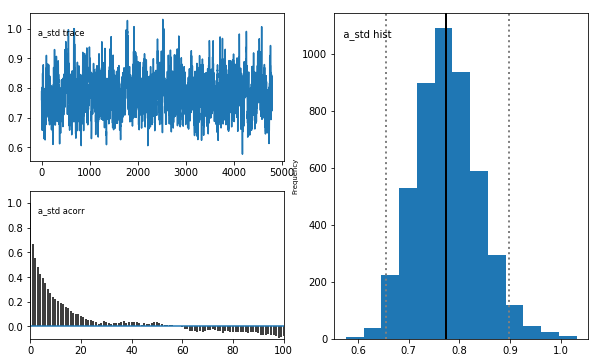

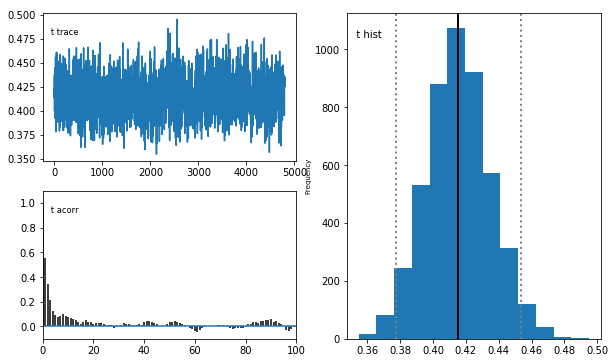

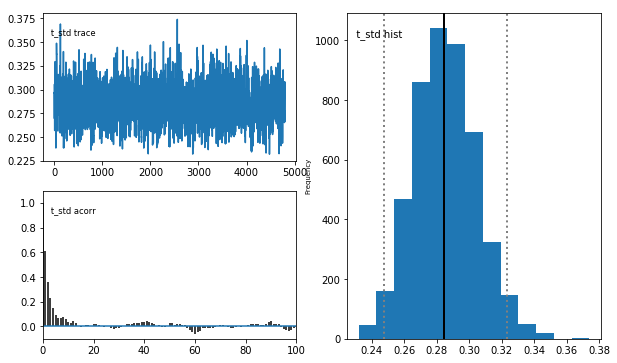

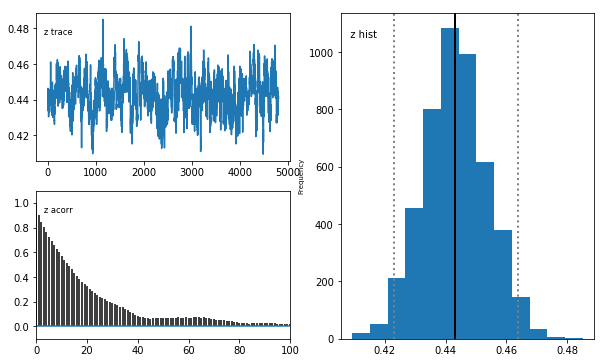

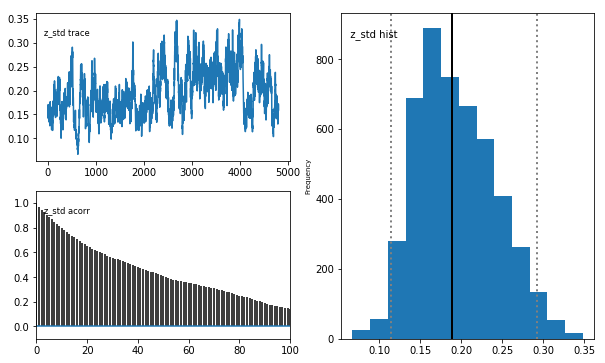

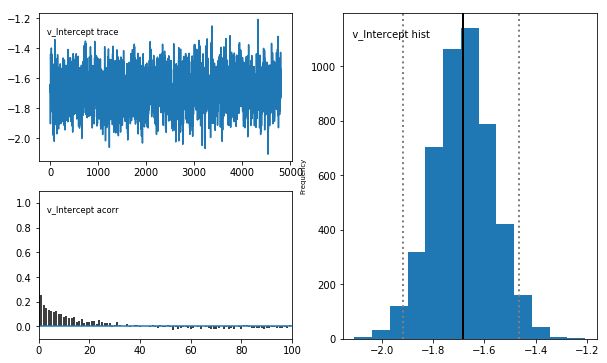

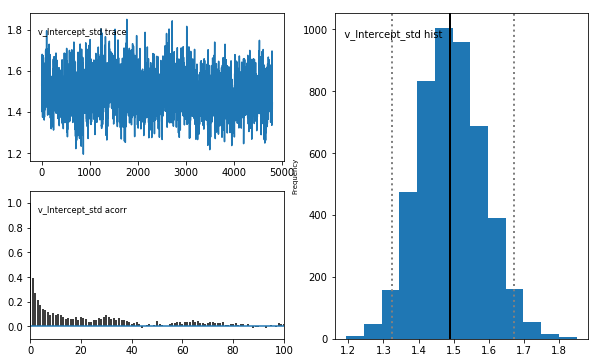

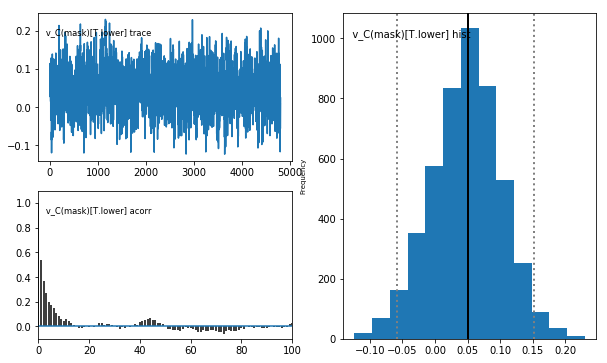

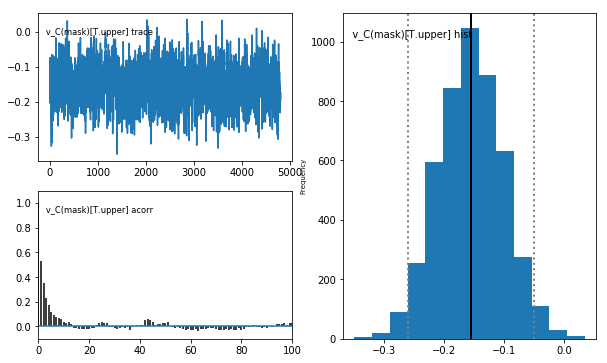

In [18]:
# run model
m_rd.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_rd.print_stats()
m_rd.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std       2.5q        25q  \
a                                   2.13695   0.277007    1.99026    2.07693   
a_std                              0.794392   0.401514   0.665169   0.733681   
a_subj.02hcv424u29nd5w              2.94773   0.392175    2.29272     2.6676   
a_subj.02k2uwlhgxnumn9              2.00069   0.312578    1.48779    1.77899   
a_subj.03g7h2hzq4o3g26              3.84062    0.64204    2.78846    3.38627   
a_subj.0nmr75cysk1ae0e              1.75492    0.26675    1.32715     1.5574   
a_subj.0t8qp67pqkw36cb              2.05277   0.393341    1.43933    1.77381   
a_subj.0vfpn4uf3t031qu              1.81319   0.533924    1.03314    1.41792   
a_subj.11dsfdtym1yy5mx              3.07205   0.389438    2.39875    2.79126   
a_subj.1d3dadyu4ekqb4q              1.37719   0.216909    1.02739    1.22219   
a_subj.1mt2emp4645cbl1              3.37463   0.561117    2.43598    2.96608   
a_subj.1rst24mbtgy9rc8              2.28

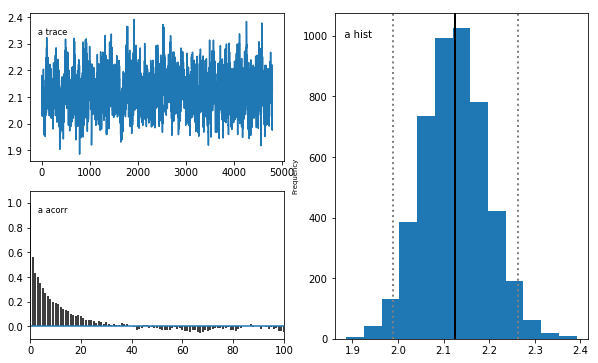

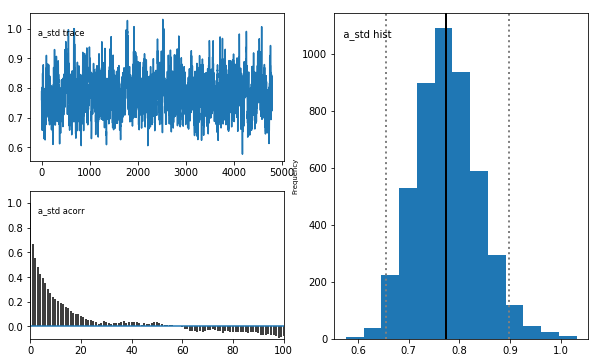

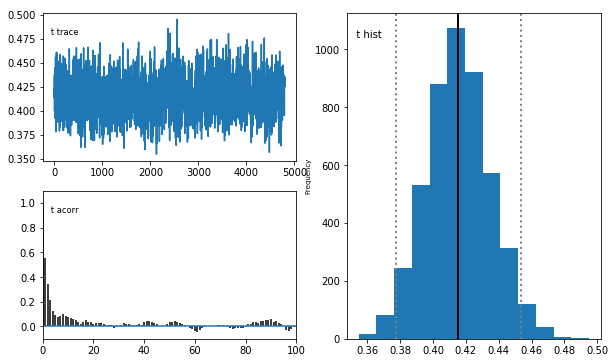

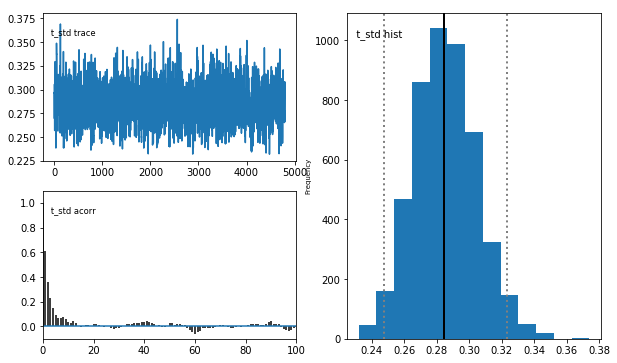

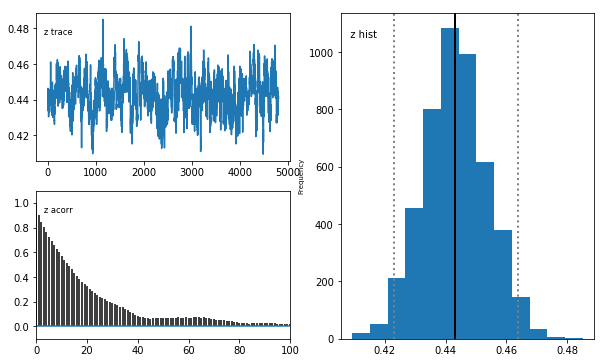

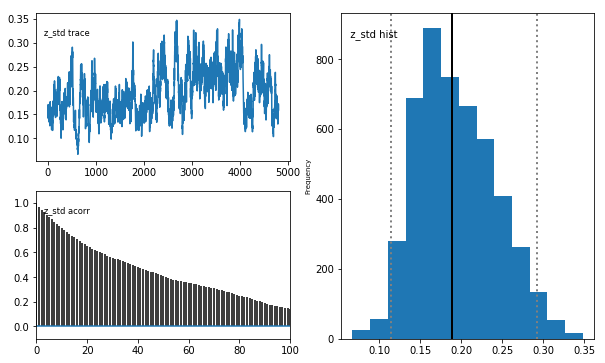

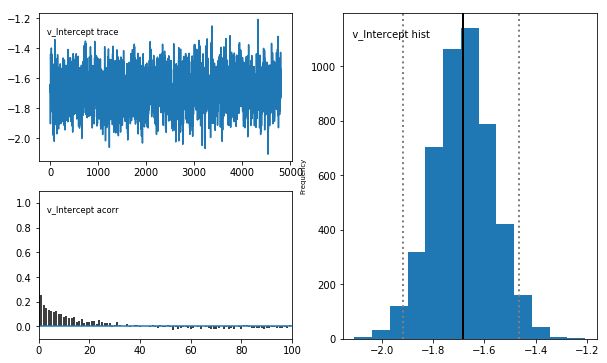

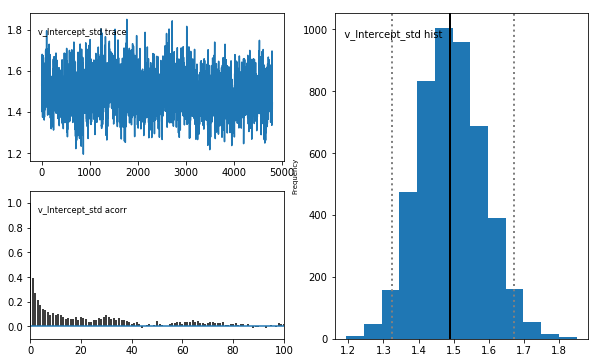

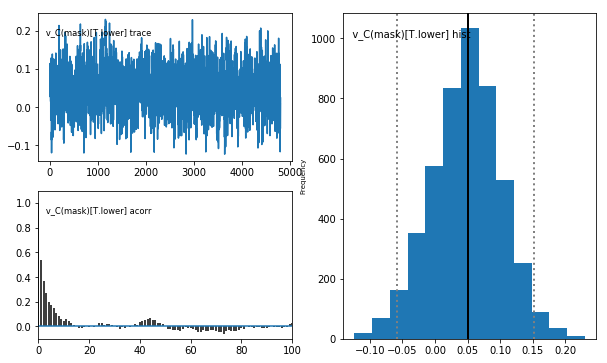

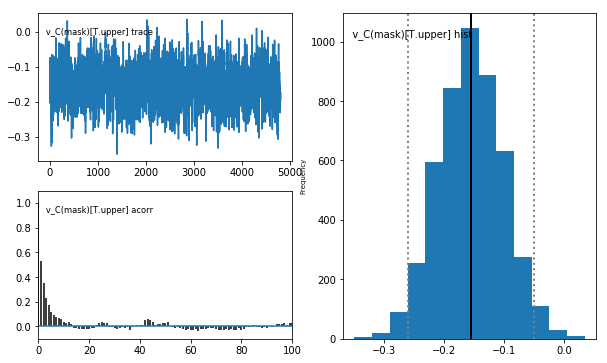

In [19]:
# save model stats
rd_stats = m_rd.gen_stats()
print(rd_stats)
rd_stats.to_csv('_maskFalsePositives/rd_5000/faceMask_hddm_drift_maskFalsePositives_rd_5000.csv', index=True)

# save model posterior plots
m_rd.plot_posteriors(path='_maskFalsePositives/rd_5000/_posteriors', save=True)

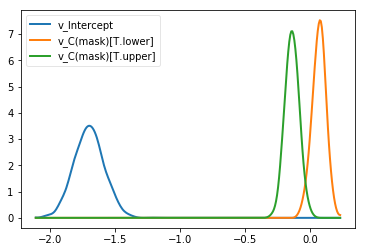

In [20]:
# plot model posteriors by mask
rd_v_none, rd_v_lower, rd_v_upper = m_rd.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([rd_v_none, rd_v_lower, rd_v_upper])
plt.savefig('_maskFalsePositives/rd_5000/faceMask_hddm_drift_maskFalsePositives_rd_5000_v_mask.pdf')

In [23]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(rd_v_none > 0) = ", (rd_v_none.trace() > 0).mean()) 
print("P(rd_v_lower < 0) = ", (rd_v_lower.trace() < 0).mean())
print("P(rd_v_upper > 0) = ", (rd_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(rd_v_lower < rd_v_upper) = ", (rd_v_lower.trace() < rd_v_upper.trace()).mean())

P(rd_v_none > 0) =  0.0
P(rd_v_lower < 0) =  0.183125
P(rd_v_upper > 0) =  0.0025
P(rd_v_lower < rd_v_upper) =  0.0


In [7]:
# subset dataset by emotion rating type (surprised) and facial expression (fearful)
rf_data = data.loc[(data['emotionRating'] == 'surprised') & (data['expression'] == 'fearful')]
rf_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
535,gc2le9xecjp1stz,5,6,surprised,541,_faces/10_M_F_L.jpg,10_M_F_L,10,M,fearful,lower,0,-0.785625,0,0,50,0,0,0
541,gc2le9xecjp1stz,5,6,surprised,547,_faces/08_F_F_X.jpg,08_F_F_X,8,F,fearful,baseline,1,1.086040,0,0,100,0,0,0
545,gc2le9xecjp1stz,5,6,surprised,551,_faces/47_M_F_U.jpg,47_M_F_U,47,M,fearful,upper,0,-1.026555,0,0,50,0,0,0
552,gc2le9xecjp1stz,5,6,surprised,558,_faces/28_M_F_X.jpg,28_M_F_X,28,M,fearful,baseline,0,-1.282005,0,0,100,0,0,0
573,gc2le9xecjp1stz,5,6,surprised,580,_faces/10_M_F_X.jpg,10_M_F_X,10,M,fearful,baseline,0,-0.102605,0,0,100,0,0,0
575,gc2le9xecjp1stz,5,6,surprised,585,_faces/47_M_F_L.jpg,47_M_F_L,47,M,fearful,lower,1,0.644690,0,0,50,0,0,0
587,gc2le9xecjp1stz,5,6,surprised,614,_faces/57_F_F_L.jpg,57_F_F_L,57,F,fearful,lower,1,0.752880,0,0,50,0,0,0
588,gc2le9xecjp1stz,5,6,surprised,615,_faces/47_M_F_X.jpg,47_M_F_X,47,M,fearful,baseline,1,0.120830,0,0,100,0,0,0
596,gc2le9xecjp1stz,5,6,surprised,625,_faces/08_F_F_U.jpg,08_F_F_U,8,F,fearful,upper,0,-0.137995,0,0,50,0,0,0
601,gc2le9xecjp1stz,5,6,surprised,634,_faces/26_F_F_L.jpg,26_F_F_L,26,F,fearful,lower,1,0.992055,0,0,50,0,0,0


In [8]:
# drop any subjects missing columns in design matrix (otherwise produces error)
# none in rf_data

In [9]:
# define model
m_rf = hddm.HDDMRegressor(rf_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\pymc\Node.py:403: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.__name__ = input['__name__']


 [-----------------100%-----------------] 5001 of 5000 complete in 49506.3 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                        mean         std        2.5q         25q         50q         75q       97.5q       mc err
a                                    1.69324    0.041652      1.6178     1.66329     1.69232     1.72165     1.77802   0.00088175
a_std                               0.568294   0.0344093    0.504526    0.544697    0.567274    0.590217    0.638573  0.000896189
a_subj.02hcv424u29nd5w               2.24635    0.312126     1.72859     2.01801     2.22053      2.4466     2.92731   0.00879376
a_subj.02k2uwlhgxnumn9               1.09203    0.153231     0.83704    0.982432     1.07532     1.18495      1.4308   0.00386517
a_subj.03g7h2hzq4o3g26               3.16382    0.373843      2.5287     2.90244     3.13233     3.39257      3.9783   0.00712244
a_subj.0nmr75cysk1ae0e               1.87201    0.239484     1.46807     1.70093     1.85367     2.01559     2.39301   0.00508506
a_subj.0t8qp67pqkw36cb               1.76084    0.258844     1.32922     1.57822     1.733

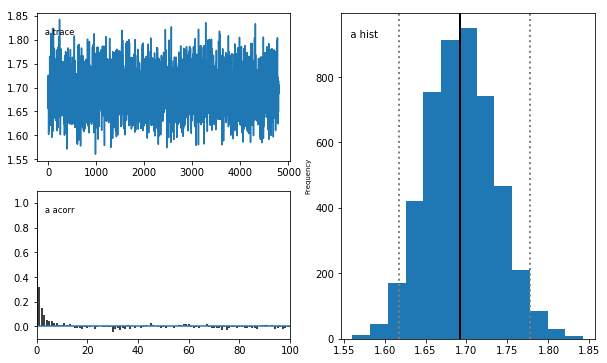

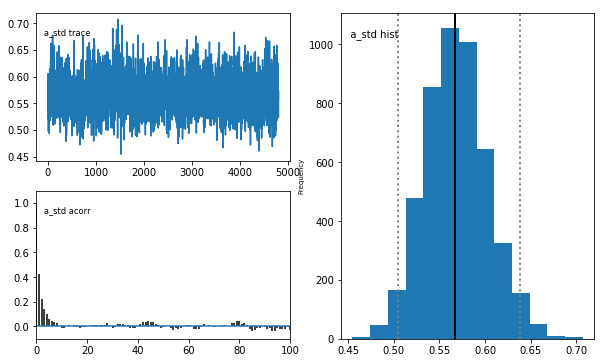

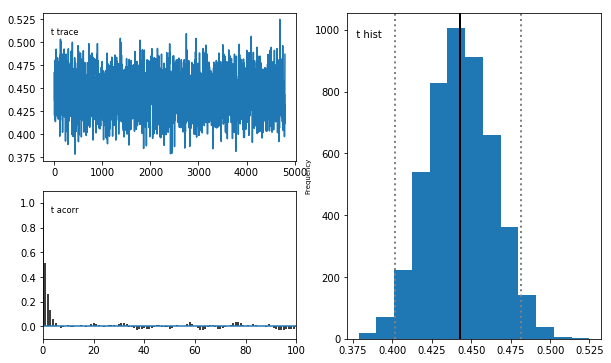

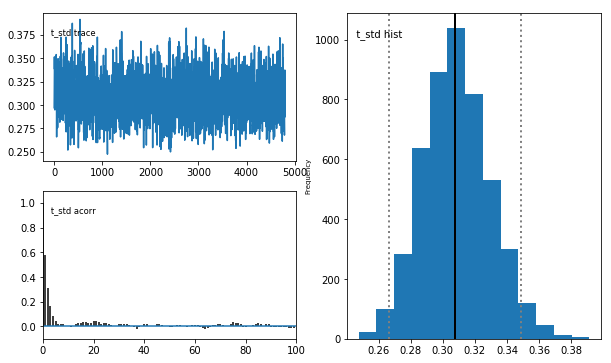

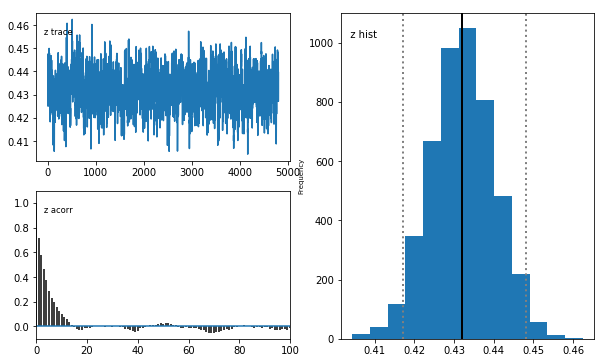

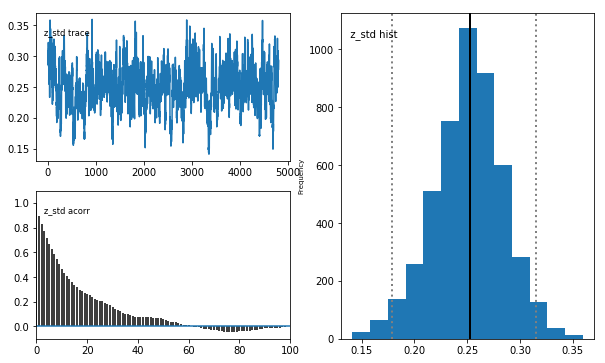

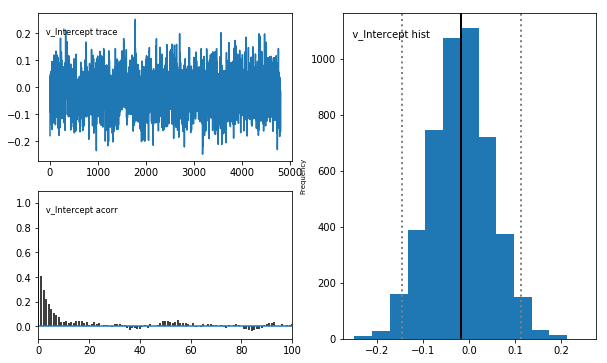

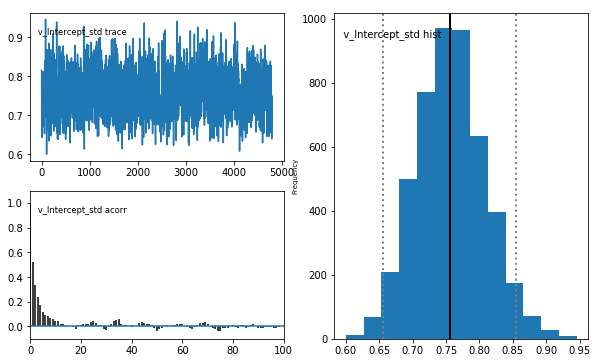

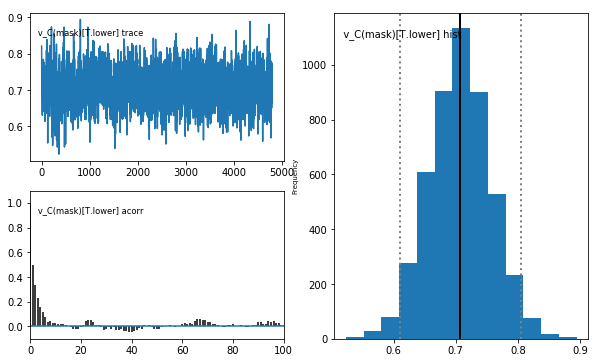

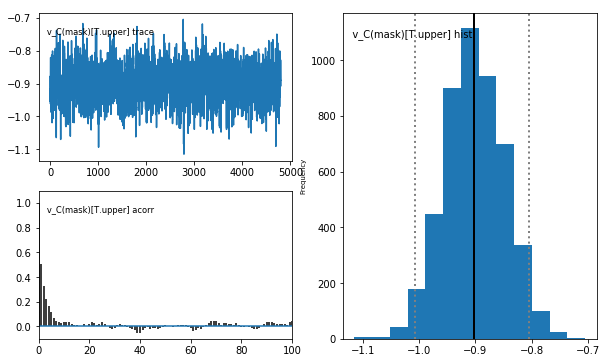

In [10]:
# run model
m_rf.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_rf.print_stats()
m_rf.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                        mean        std      2.5q         25q  \
a                                    1.69324   0.041652    1.6178     1.66329   
a_std                               0.568294  0.0344093  0.504526    0.544697   
a_subj.02hcv424u29nd5w               2.24635   0.312126   1.72859     2.01801   
a_subj.02k2uwlhgxnumn9               1.09203   0.153231   0.83704    0.982432   
a_subj.03g7h2hzq4o3g26               3.16382   0.373843    2.5287     2.90244   
a_subj.0nmr75cysk1ae0e               1.87201   0.239484   1.46807     1.70093   
a_subj.0t8qp67pqkw36cb               1.76084   0.258844   1.32922     1.57822   
a_subj.0vfpn4uf3t031qu               1.36861   0.170828   1.07123     1.24793   
a_subj.11dsfdtym1yy5mx               2.32776   0.254774   1.88622     2.14937   
a_subj.1d3dadyu4ekqb4q                1.3389   0.193016   1.02386      1.1994   
a_subj.1mt2emp4645cbl1               1.78354   0.243383   1.37818     1.61462   
a_subj.1rst24mbtgy9rc8      

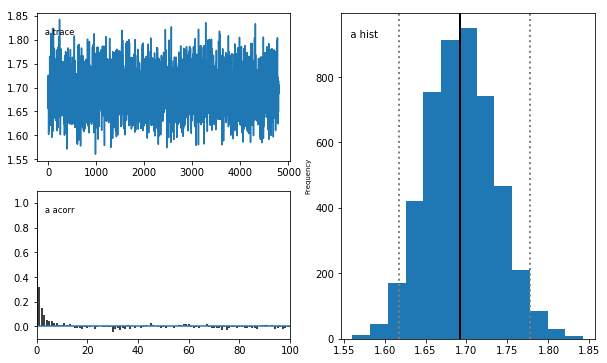

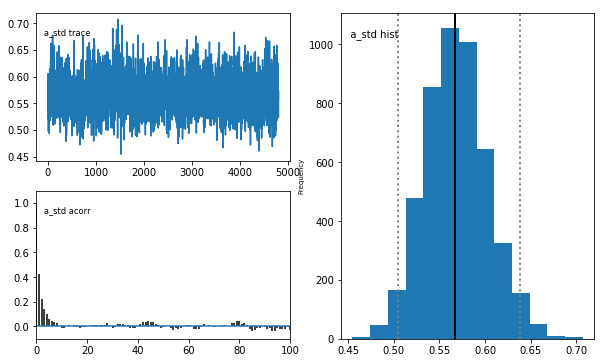

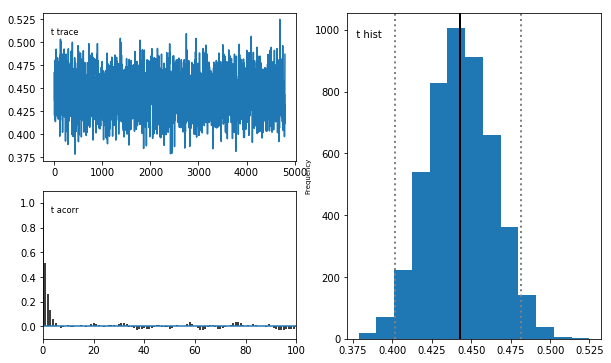

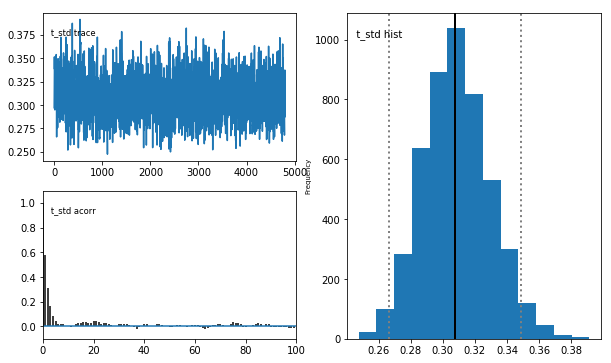

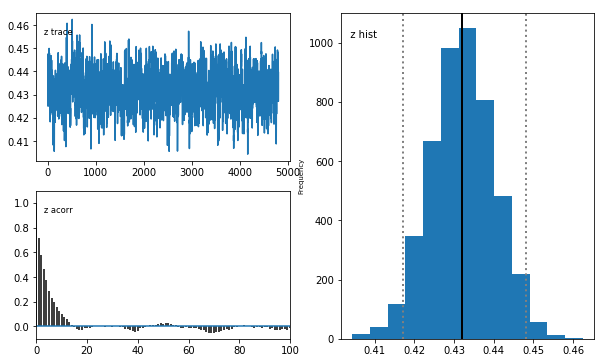

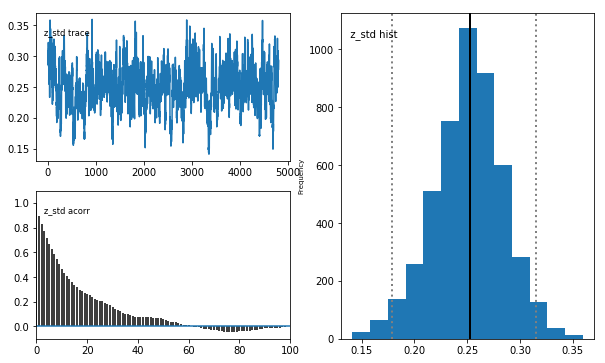

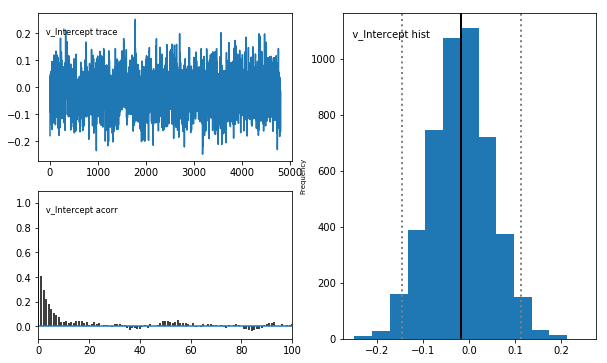

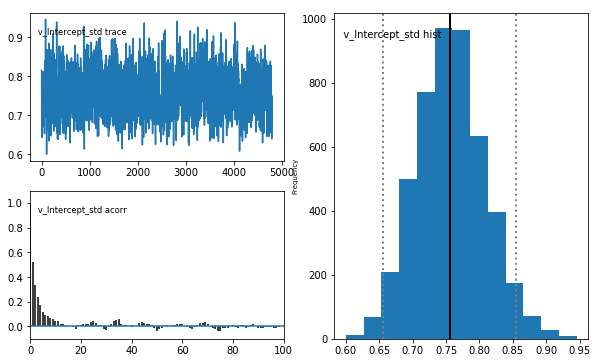

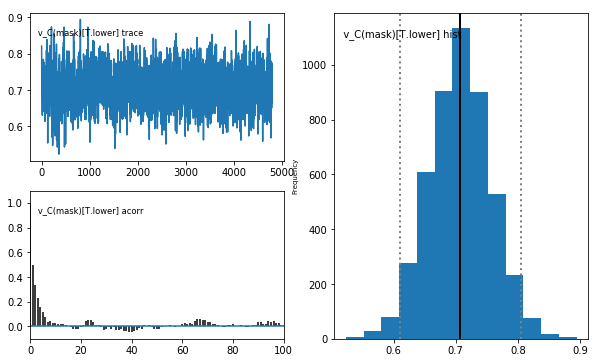

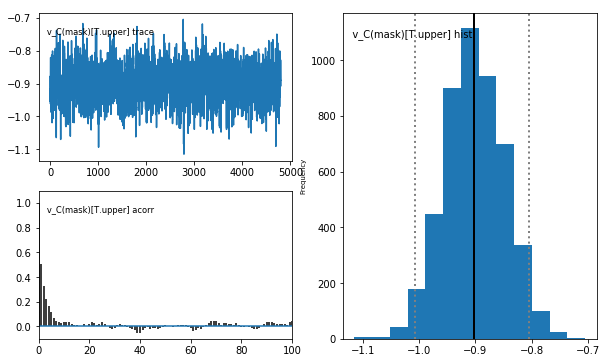

In [11]:
# save model stats
rf_stats = m_rf.gen_stats()
print(rf_stats)
rf_stats.to_csv('_maskFalsePositives/rf_5000/faceMask_hddm_drift_maskFalsePositives_rf_5000.csv', index=True)

# save model posterior plots
m_rf.plot_posteriors(path='_maskFalsePositives/rf_5000/_posteriors', save=True)

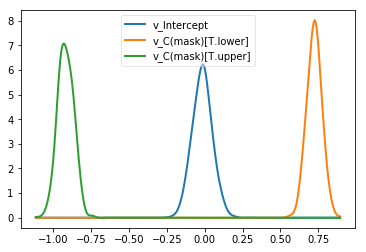

In [12]:
# plot model posteriors by mask
rf_v_none, rf_v_lower, rf_v_upper = m_rf.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([rf_v_none, rf_v_lower, rf_v_upper])
plt.savefig('_maskFalsePositives/rf_5000/faceMask_hddm_drift_maskFalsePositives_rf_5000_v_mask.pdf')

In [15]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(rf_v_none > 0) = ", (rf_v_none.trace() > 0).mean()) 
print("P(rf_v_lower < 0) = ", (rf_v_lower.trace() < 0).mean())
print("P(rf_v_upper > 0) = ", (rf_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(rf_v_lower < rf_v_upper) = ", (rf_v_lower.trace() < rf_v_upper.trace()).mean())

P(rf_v_none > 0) =  0.383333333333
P(rf_v_lower < 0) =  0.0
P(rf_v_upper > 0) =  0.0
P(rf_v_lower < rf_v_upper) =  0.0


In [16]:
# subset dataset by emotion rating type (surprised) and facial expression (happy)
rh_data = data.loc[(data['emotionRating'] == 'surprised') & (data['expression'] == 'happy')]
rh_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
538,gc2le9xecjp1stz,5,6,surprised,544,_faces/12_F_H_X.jpg,12_F_H_X,12,F,happy,baseline,1,0.888315,0,0,0,100,0,0
542,gc2le9xecjp1stz,5,6,surprised,548,_faces/49_M_H_X.jpg,49_M_H_X,49,M,happy,baseline,1,1.092055,0,0,0,100,0,0
544,gc2le9xecjp1stz,5,6,surprised,550,_faces/27_F_H_L.jpg,27_F_H_L,27,F,happy,lower,0,-0.717145,0,0,0,50,0,0
548,gc2le9xecjp1stz,5,6,surprised,554,_faces/15_M_H_L.jpg,15_M_H_L,15,M,happy,lower,1,1.055460,0,0,0,50,0,0
555,gc2le9xecjp1stz,5,6,surprised,561,_faces/27_F_H_X.jpg,27_F_H_X,27,F,happy,baseline,1,1.323400,0,0,0,100,0,0
560,gc2le9xecjp1stz,5,6,surprised,566,_faces/12_F_H_U.jpg,12_F_H_U,12,F,happy,upper,1,0.860565,0,0,0,50,0,0
565,gc2le9xecjp1stz,5,6,surprised,571,_faces/58_F_H_U.jpg,58_F_H_U,58,F,happy,upper,0,-1.103570,0,0,0,50,0,0
566,gc2le9xecjp1stz,5,6,surprised,572,_faces/49_M_H_U.jpg,49_M_H_U,49,M,happy,upper,1,0.835500,0,0,0,50,0,0
570,gc2le9xecjp1stz,5,6,surprised,576,_faces/30_M_H_X.jpg,30_M_H_X,30,M,happy,baseline,1,0.715135,0,0,0,100,0,0
583,gc2le9xecjp1stz,5,6,surprised,603,_faces/27_F_H_U.jpg,27_F_H_U,27,F,happy,upper,1,0.117510,0,0,0,50,0,0


In [17]:
# drop any subjects missing columns in design matrix (otherwise produces error)
rh_data = rh_data[(rh_data.subj_idx != 'ygpcur698h4dcw5')]

In [18]:
# define model
m_rh = hddm.HDDMRegressor(rh_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 52848.4 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std        2.5q        25q        50q         75q       97.5q       mc err
a                                   2.02864  0.0877555     1.90431    1.98298     2.0262     2.06819     2.15614   0.00345521
a_std                              0.731157   0.109845     0.62415   0.689988   0.725622     0.76417     0.84406   0.00443807
a_subj.02hcv424u29nd5w              3.02794   0.491621     2.20677    2.66741    2.97436     3.34449     4.07817    0.0170448
a_subj.02k2uwlhgxnumn9              2.48672   0.670106     1.43178    1.99151    2.40584     2.89574     3.98946    0.0326611
a_subj.03g7h2hzq4o3g26              2.74594   0.375138     2.11235    2.48644    2.70986     2.97037     3.58545    0.0104633
a_subj.0nmr75cysk1ae0e              1.46667   0.217583      1.1142    1.31107    1.44611     1.59572     1.96692   0.00588313
a_subj.0t8qp67pqkw36cb              2.47469   0.626133     1.47739     2.0202     2.3958     2.83902     3.93974    0.

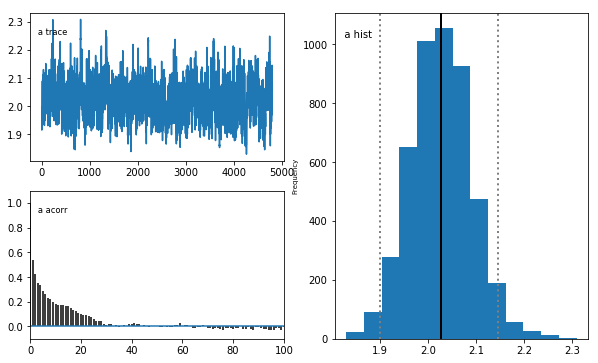

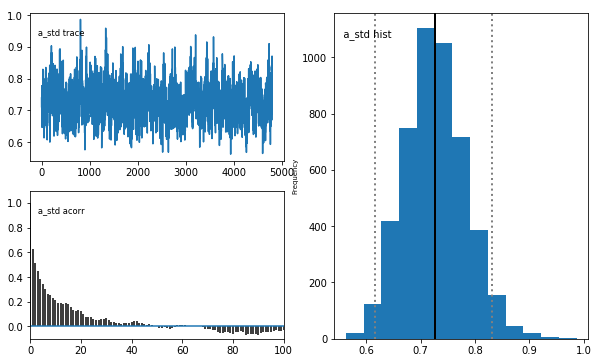

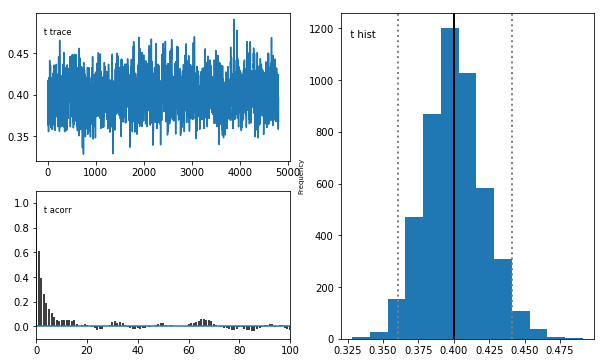

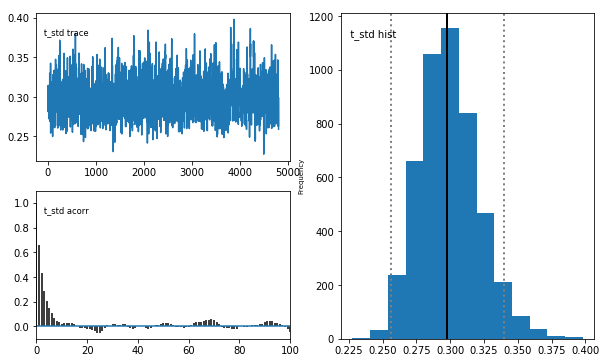

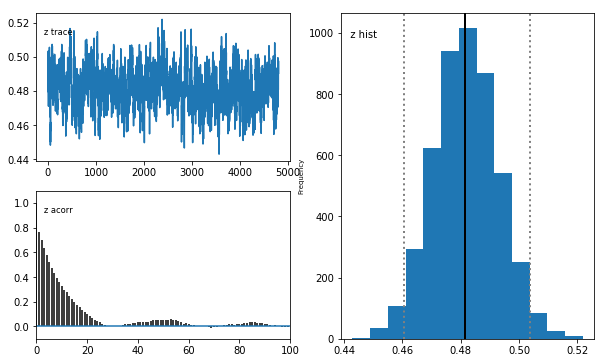

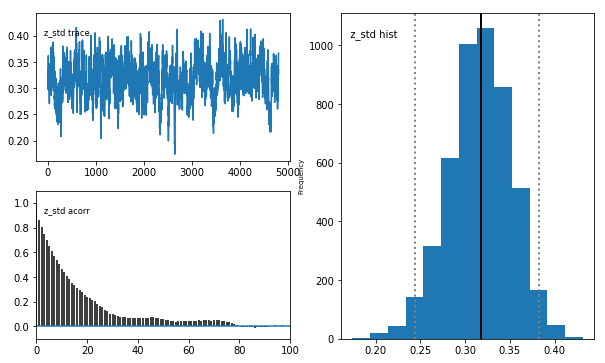

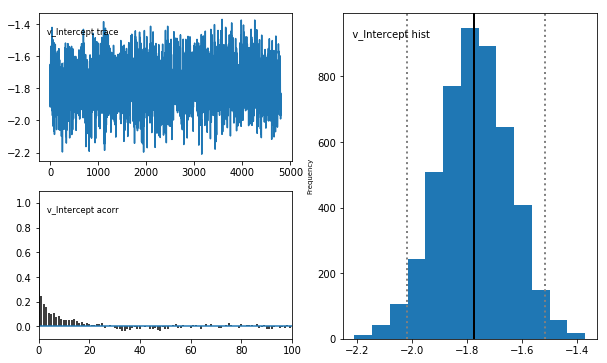

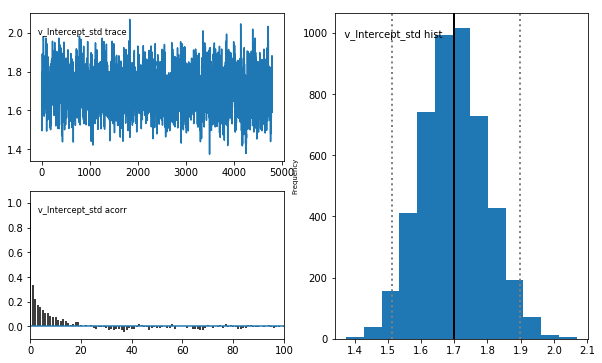

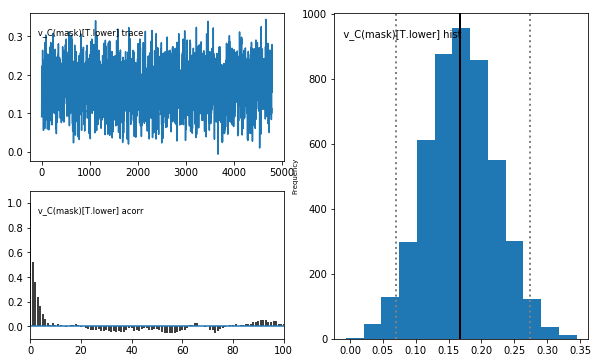

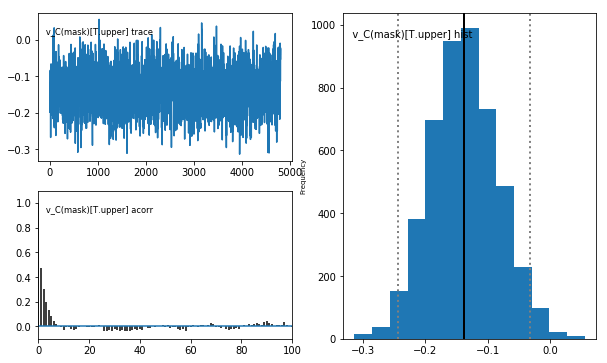

In [20]:
# run model
m_rh.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_rh.print_stats()
m_rh.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std       2.5q       25q  \
a                                   2.02864  0.0877555    1.90431   1.98298   
a_std                              0.731157   0.109845    0.62415  0.689988   
a_subj.02hcv424u29nd5w              3.02794   0.491621    2.20677   2.66741   
a_subj.02k2uwlhgxnumn9              2.48672   0.670106    1.43178   1.99151   
a_subj.03g7h2hzq4o3g26              2.74594   0.375138    2.11235   2.48644   
a_subj.0nmr75cysk1ae0e              1.46667   0.217583     1.1142   1.31107   
a_subj.0t8qp67pqkw36cb              2.47469   0.626133    1.47739    2.0202   
a_subj.0vfpn4uf3t031qu              1.09703   0.177313   0.809248  0.970817   
a_subj.11dsfdtym1yy5mx              2.46528   0.281445    1.96347   2.26995   
a_subj.1d3dadyu4ekqb4q              1.18038   0.201026    0.87384   1.03581   
a_subj.1mt2emp4645cbl1              2.79515   0.518431    1.98409   2.42837   
a_subj.1rst24mbtgy9rc8              2.77291   0.4325

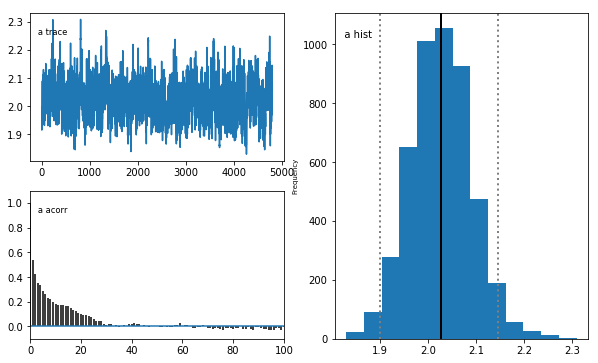

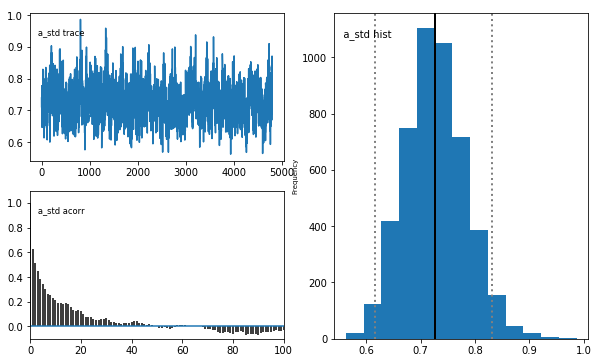

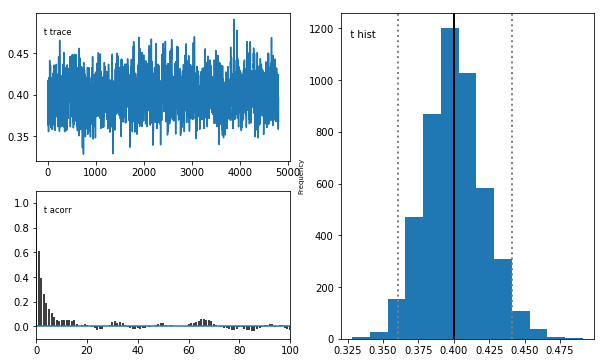

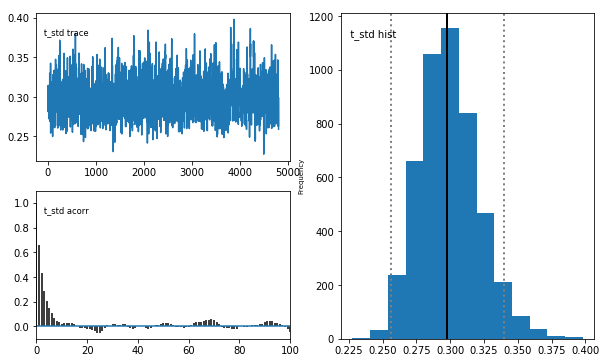

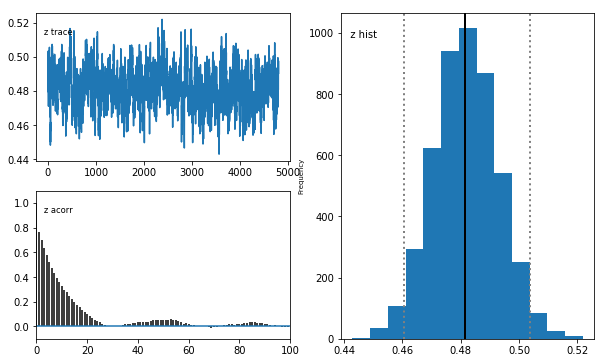

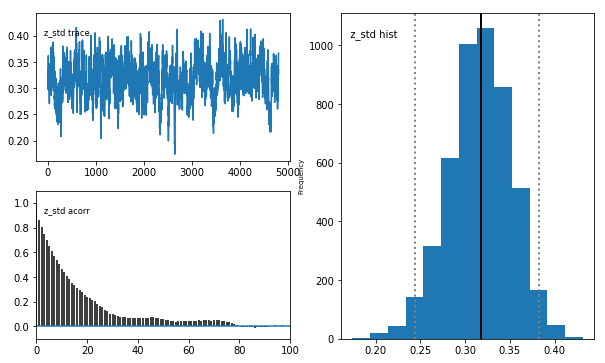

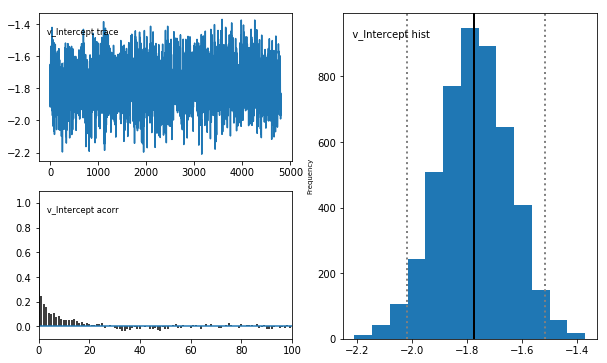

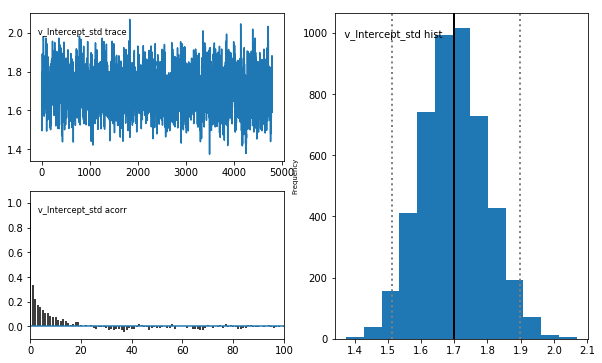

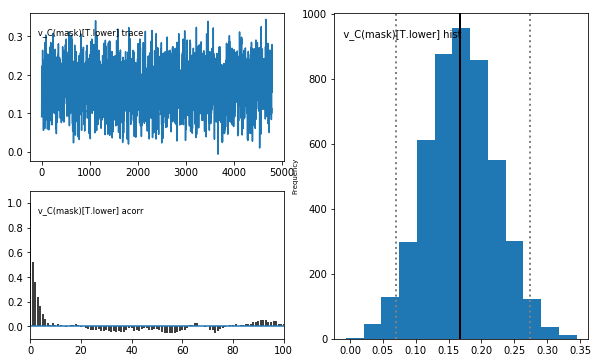

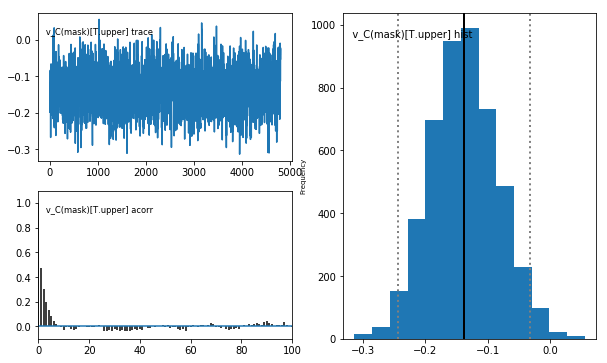

In [21]:
# save model stats
rh_stats = m_rh.gen_stats()
print(rh_stats)
rh_stats.to_csv('_maskFalsePositives/rh_5000/faceMask_hddm_drift_maskFalsePositives_rh_5000.csv', index=True)

# save model posterior plots
m_rh.plot_posteriors(path='_maskFalsePositives/rh_5000/_posteriors', save=True)

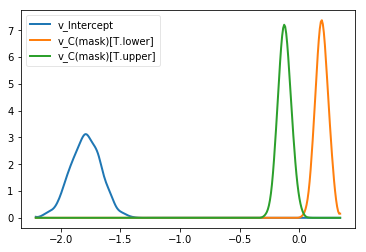

In [22]:
# plot model posteriors by mask
rh_v_none, rh_v_lower, rh_v_upper = m_rh.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([rh_v_none, rh_v_lower, rh_v_upper])
plt.savefig('_maskFalsePositives/rh_5000/faceMask_hddm_drift_maskFalsePositives_rh_5000_v_mask.pdf')

In [25]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(rh_v_none > 0) = ", (rh_v_none.trace() > 0).mean()) 
print("P(rh_v_lower < 0) = ", (rh_v_lower.trace() < 0).mean())
print("P(rh_v_upper > 0) = ", (rh_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(rh_v_lower < rh_v_upper) = ", (rh_v_lower.trace() < rh_v_upper.trace()).mean())

P(rh_v_none > 0) =  0.0
P(rh_v_lower < 0) =  0.000208333333333
P(rh_v_upper > 0) =  0.005625
P(rh_v_lower < rh_v_upper) =  0.0


In [26]:
# subset dataset by emotion rating type (surprised) and facial expression (sad)
rs_data = data.loc[(data['emotionRating'] == 'surprised') & (data['expression'] == 'sad')]
rs_data.head(10)

,subj_idx,block,faceList,emotionRating,trial,stimulus,face,model,sex,expression,mask,response,rt,faceAngry,faceDisgusted,faceFearful,faceHappy,faceSad,faceSurprised
537,gc2le9xecjp1stz,5,6,surprised,543,_faces/32_F_S_U.jpg,32_F_S_U,32,F,sad,upper,0,-0.782495,0,0,0,0,50,0
540,gc2le9xecjp1stz,5,6,surprised,546,_faces/05_M_S_U.jpg,05_M_S_U,5,M,sad,upper,0,-1.182300,0,0,0,0,50,0
547,gc2le9xecjp1stz,5,6,surprised,553,_faces/23_M_S_L.jpg,23_M_S_L,23,M,sad,lower,0,-1.011945,0,0,0,0,50,0
551,gc2le9xecjp1stz,5,6,surprised,557,_faces/05_M_S_X.jpg,05_M_S_X,5,M,sad,baseline,0,-1.100160,0,0,0,0,100,0
557,gc2le9xecjp1stz,5,6,surprised,563,_faces/32_F_S_L.jpg,32_F_S_L,32,F,sad,lower,0,-1.111330,0,0,0,0,50,0
559,gc2le9xecjp1stz,5,6,surprised,565,_faces/36_M_S_X.jpg,36_M_S_X,36,M,sad,baseline,0,-1.115480,0,0,0,0,100,0
563,gc2le9xecjp1stz,5,6,surprised,569,_faces/16_F_S_U.jpg,16_F_S_U,16,F,sad,upper,0,-0.940895,0,0,0,0,50,0
579,gc2le9xecjp1stz,5,6,surprised,589,_faces/16_F_S_X.jpg,16_F_S_X,16,F,sad,baseline,0,-0.157240,0,0,0,0,100,0
581,gc2le9xecjp1stz,5,6,surprised,598,_faces/01_F_S_L.jpg,01_F_S_L,1,F,sad,lower,1,0.117470,0,0,0,0,50,0
597,gc2le9xecjp1stz,5,6,surprised,627,_faces/16_F_S_L.jpg,16_F_S_L,16,F,sad,lower,1,0.106625,0,0,0,0,50,0


In [27]:
# drop any subjects missing columns in design matrix (otherwise produces error)
rs_data = rs_data[(rs_data.subj_idx != '7chb1ucy8l7g29z')]

In [28]:
# define model
m_rs = hddm.HDDMRegressor(rs_data, "v ~ C(mask)", bias=True, p_outlier=0.05)

Adding these covariates:
['v_Intercept', 'v_C(mask)[T.lower]', 'v_C(mask)[T.upper]']


 [-----------------100%-----------------] 5001 of 5000 complete in 52430.5 sec

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                        mean        std        2.5q        25q         50q         75q      97.5q       mc err
a                                    2.09245   0.109949     1.96386    2.04454     2.08695     2.13112    2.22499   0.00528875
a_std                               0.741277   0.102657    0.625993   0.695269    0.734509    0.778127   0.866115   0.00501628
a_subj.02hcv424u29nd5w               2.79914   0.290717     2.27328    2.59999     2.78162     2.98095    3.42178   0.00534144
a_subj.02k2uwlhgxnumn9               2.06604   0.358768     1.50103    1.81475     2.01914     2.27344    2.89339    0.0112479
a_subj.03g7h2hzq4o3g26                3.4762   0.602858     2.50366    3.04769     3.39894     3.83012    4.83965    0.0193262
a_subj.0nmr75cysk1ae0e               2.25343   0.289148     1.76211    2.04596     2.22808      2.4305    2.89371   0.00771418
a_subj.0t8qp67pqkw36cb               2.06725   0.538836     1.22096     1.6649      1.9935     2.38876    3.348

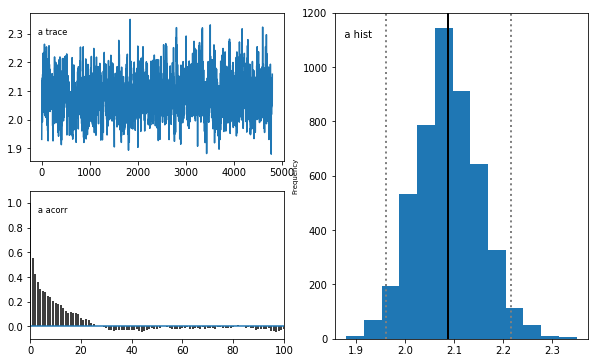

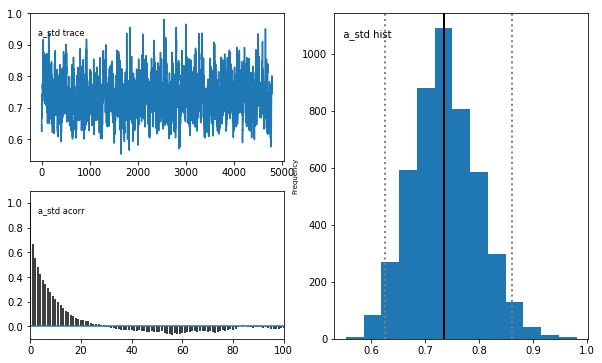

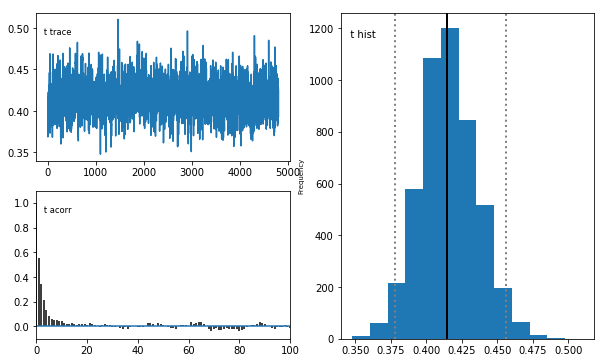

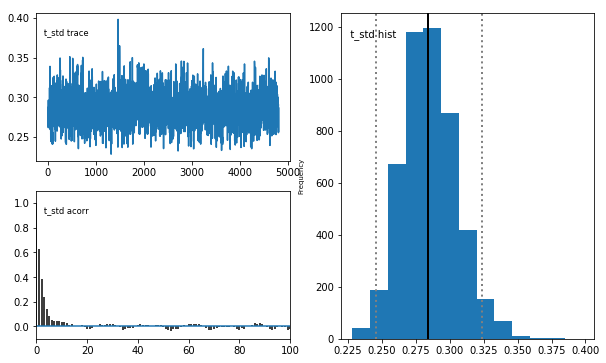

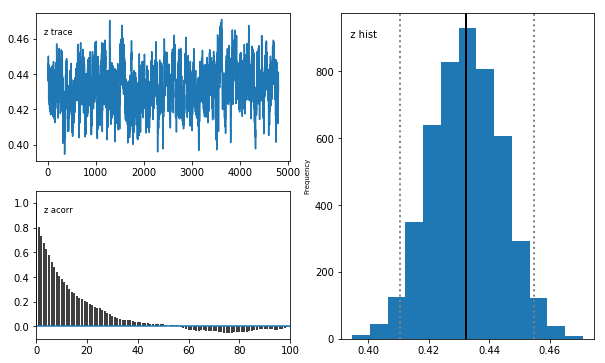

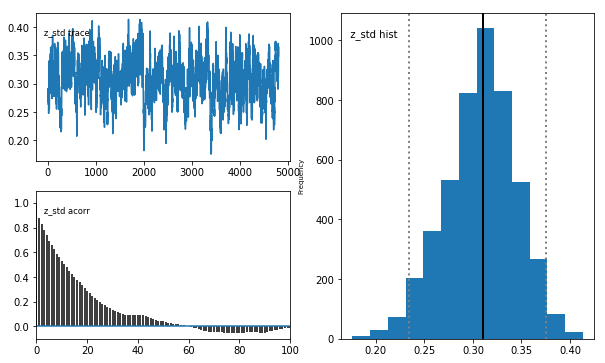

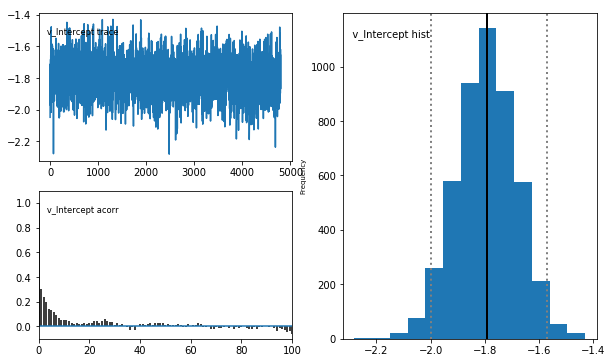

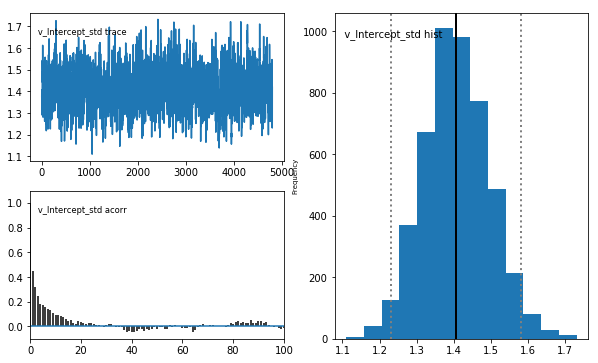

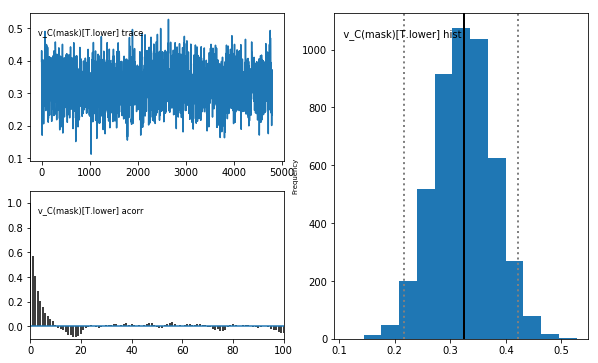

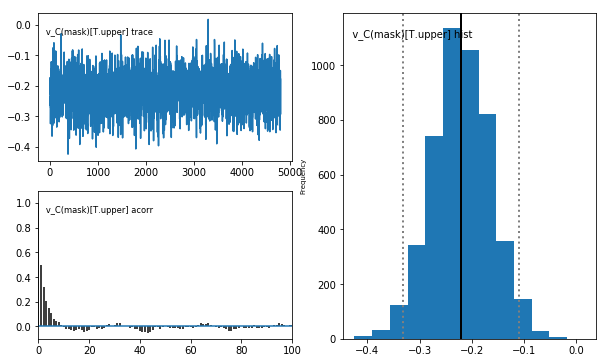

In [30]:
# run model
m_rs.sample(5000, burn=200, dbname='traces.db', db='pickle')
m_rs.print_stats()
m_rs.plot_posteriors()

C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-packages\numpy\core\fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
C:\Users\tazee\Anaconda2\envs\hddm\lib\site-pack

                                       mean        std      2.5q       25q  \
a                                   2.09245   0.109949   1.96386   2.04454   
a_std                              0.741277   0.102657  0.625993  0.695269   
a_subj.02hcv424u29nd5w              2.79914   0.290717   2.27328   2.59999   
a_subj.02k2uwlhgxnumn9              2.06604   0.358768   1.50103   1.81475   
a_subj.03g7h2hzq4o3g26               3.4762   0.602858   2.50366   3.04769   
a_subj.0nmr75cysk1ae0e              2.25343   0.289148   1.76211   2.04596   
a_subj.0t8qp67pqkw36cb              2.06725   0.538836   1.22096    1.6649   
a_subj.0vfpn4uf3t031qu              2.29376   0.613169   1.35073   1.84933   
a_subj.11dsfdtym1yy5mx              2.43675   0.354758   1.84546   2.18158   
a_subj.1d3dadyu4ekqb4q              1.18253   0.150865  0.938322   1.07438   
a_subj.1mt2emp4645cbl1              3.26886   0.544311   2.38471   2.86851   
a_subj.1rst24mbtgy9rc8              2.96845   0.523448   2.12481

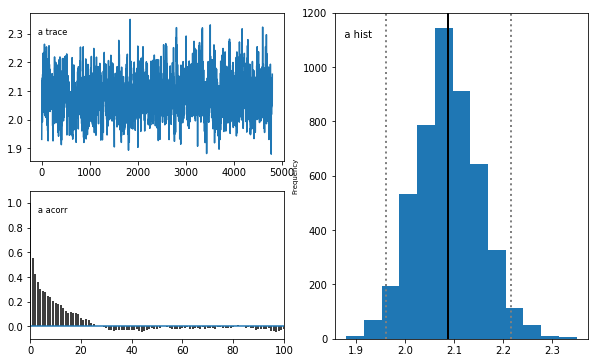

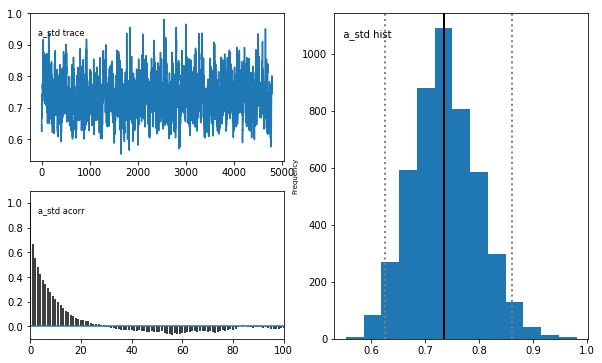

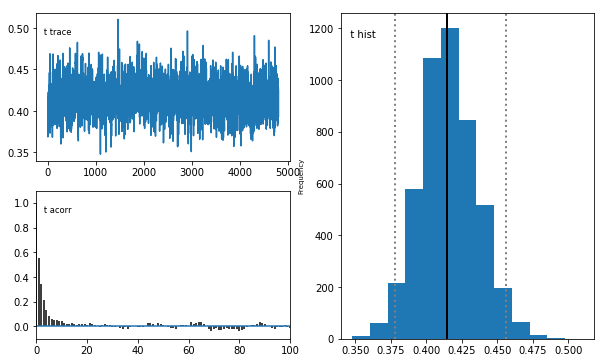

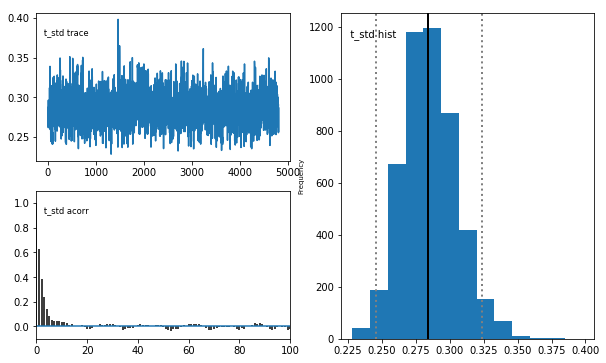

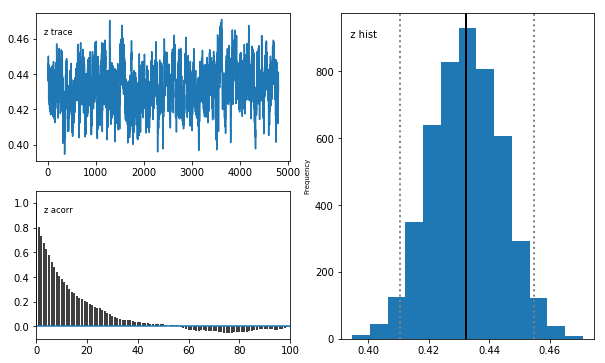

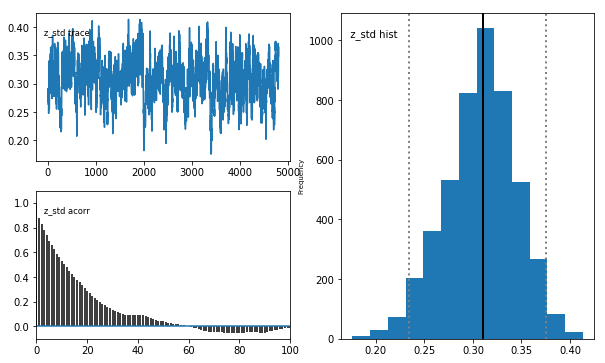

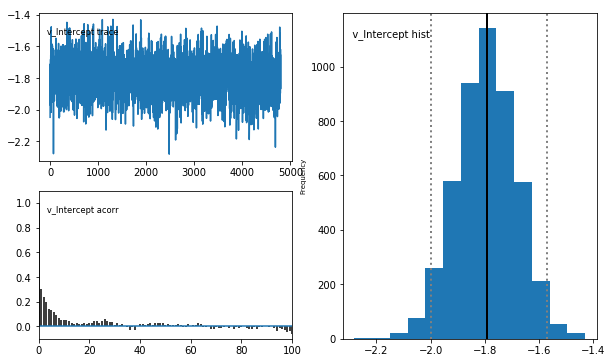

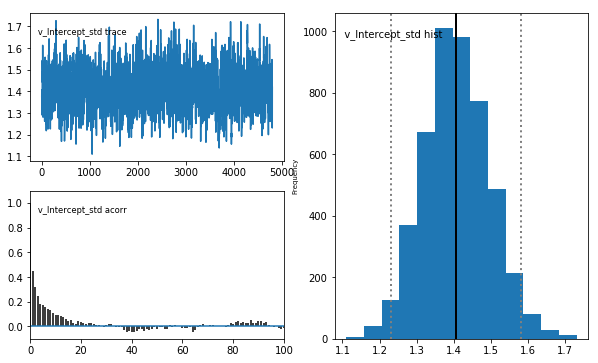

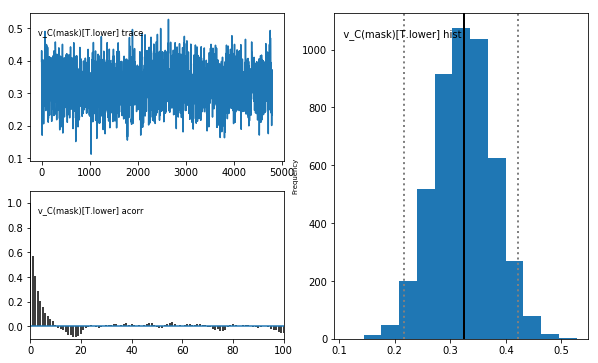

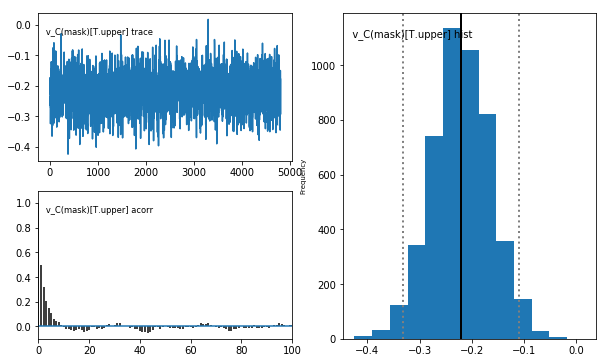

In [31]:
# save model stats
rs_stats = m_rs.gen_stats()
print(rs_stats)
rs_stats.to_csv('_maskFalsePositives/rs_5000/faceMask_hddm_drift_maskFalsePositives_rs_5000.csv', index=True)

# save model posterior plots
m_rs.plot_posteriors(path='_maskFalsePositives/rs_5000/_posteriors', save=True)

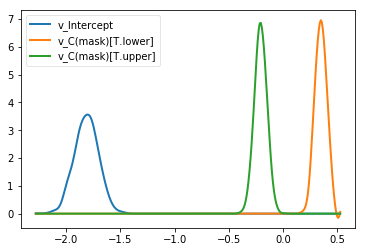

In [32]:
# plot model posteriors by mask
rs_v_none, rs_v_lower, rs_v_upper = m_rs.nodes_db.node[["v_Intercept", "v_C(mask)[T.lower]", "v_C(mask)[T.upper]"]]
hddm.analyze.plot_posterior_nodes([rs_v_none, rs_v_lower, rs_v_upper])
plt.savefig('_maskFalsePositives/rs_5000/faceMask_hddm_drift_maskFalsePositives_rs_5000_v_mask.pdf')

In [35]:
## estimate probabilities that mask coefficient posteriors differ from 0
# note that comparison condition coefficients (i.e. lower/upper) are *relative to* baseline condition (i.e. no mask)
# for lower/upper, =0 means no change from baseline, <0 means less than baseline, and >0 means greater than baseline
# for no mask, =0 means null drift, <0 means negative drift, and >0 means positive drift
print("P(rs_v_none > 0) = ", (rs_v_none.trace() > 0).mean()) 
print("P(rs_v_lower < 0) = ", (rs_v_lower.trace() < 0).mean())
print("P(rs_v_upper > 0) = ", (rs_v_upper.trace() > 0).mean())
# estimate probability that lower and upper mask coefficient posteriors differ
print("P(rs_v_lower < rs_v_upper) = ", (rs_v_lower.trace() < rs_v_upper.trace()).mean())

P(rs_v_none > 0) =  0.0
P(rs_v_lower < 0) =  0.0
P(rs_v_upper > 0) =  0.000208333333333
P(rs_v_lower < rs_v_upper) =  0.0
